In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import os
from datetime import datetime, date

# Data loading

In [7]:
DATA_PATH = "data/fage-automne2021_merle-printemps2022/"
allFiles = os.listdir(DATA_PATH)    
csvFiles = list(filter(lambda f: f.endswith('.csv'), allFiles))
print(len(csvFiles), 'datasets loaded')
print(csvFiles)
rawData = {csvFile:pd.read_csv(DATA_PATH+csvFile, sep=';', header=1) for csvFile in csvFiles}

19 datasets loaded
['Supagro_25th-March-2022-13-40-58_COL14042.csv', 'Supagro_28th-March-2022-15-14-27_COL14263.csv', 'Supagro_28th-March-2022-15-2-36_COL23.csv', 'Supagro_28th-March-2022-15-26-27_COL14274.csv', 'Supagro_28th-March-2022-15-37-35_COL19.csv', 'Supagro_28th-March-2022-15-47-17_COL4109.csv', 'Supagro_28th-March-2022-15-57-49_COL14041.csv', 'Supagro_28th-March-2022-16-19-10_COL20.csv', 'Supagro_28th-March-2022-16-30-59_COL17.csv', 'Supagro_28th-March-2022-16-52-45_COL4005.csv', 'Supagro_28th-March-2022-16-8-10_COL14244.csv', 'Supagro_28th-March-2022-17-15-49_COL4279.csv', 'Supagro_28th-March-2022-17-30-14_COL22.csv', 'Supagro_28th-March-2022-17-39-50_COL18.csv', 'Supagro_28th-March-2022-17-4-7_COL21.csv', 'Supagro_28th-March-2022-17-52-54_COL25.csv', 'Supagro_28th-March-2022-18-16-12_COL4288.csv', 'Supagro_28th-March-2022-18-27-23_COL14134.csv', 'Supagro_28th-March-2022-18-5-29_COL13.csv']


Let's see raw data and especialy timestamp over time.

In [8]:
first_key= list(rawData.keys())[0]

0    1632232436
1    1632232736
2    1632233036
3    1632233336
4    1632233636
Name: Date de relevé, dtype: int64


<AxesSubplot:>

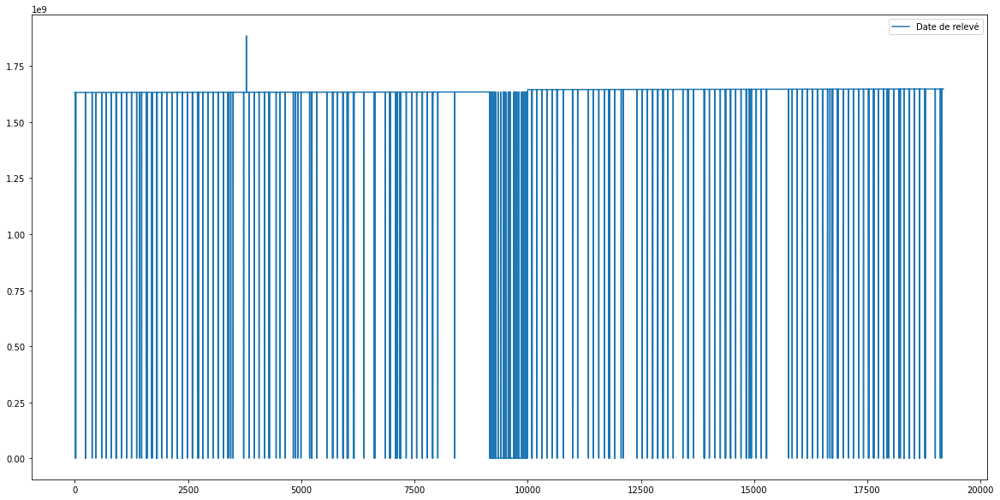

In [9]:
print(rawData[first_key]['Date de relevé'].head())
rawData[first_key]['Date de relevé'].plot(figsize=(20, 10), legend=True)

Data are very chaotic, a cleaning step is needed.

# Clean data

In [10]:
def changeColumnsNames(df, names):
    df.columns=names
    return df

def changeFormatToNumeric(df):
    return df.apply(pd.to_numeric, errors='coerce')

def addDateColumn(df):
    df['date'] = pd.to_datetime(df.timestamp, unit="s")
    return df

def cleanTimestamp(df):
    df = df.loc[df.timestamp != -1].reset_index(drop=True)
    df.loc[df.timestamp < df.timestamp[0], 'timestamp'] = -1
    df.loc[df.timestamp > df.timestamp[len(df)-1], 'timestamp'] = -1
    df = df.loc[df.timestamp != -1].reset_index(drop=True)
    return df

def handleNan(df):
    return df.dropna().reset_index(drop=True)


In [11]:
# cleaning function for one dataset
def cleaningPipeline(df):
    cleanedDf = df.copy()
    cleanedDf = cleanedDf\
        .pipe(changeColumnsNames, ['timestamp', 'lat', 'lon'])\
        .pipe(changeFormatToNumeric)\
        .pipe(addDateColumn)\
        .pipe(cleanTimestamp)\
        .pipe(handleNan)
    return cleanedDf


In [25]:
#APPLY CLEANING PIPELINE TO THE DATA
 
cleanDatasetList = {k: cleaningPipeline(v) for k, v in rawData.items()}
print(cleanDatasetList[first_key].reset_index().head())

   index   timestamp        lat       lon                date
0      0  1632232436  43.930740  3.100718 2021-09-21 13:53:56
1      1  1632232736  43.930817  3.100728 2021-09-21 13:58:56
2      2  1632233036  43.930970  3.100023 2021-09-21 14:03:56
3      3  1632233336  43.931328  3.100295 2021-09-21 14:08:56
4      4  1632233636  43.931286  3.100298 2021-09-21 14:13:56


In [26]:
first=True
for k,df in cleanDatasetList.items():
    local_max=max(df.date)
    local_min=min(df.date)
    if first or max_date < local_max:
        max_date=local_max
    if first or min_date > local_min:
        min_date=local_min
print(min_date,max_date)

2021-09-21 14:12:46 2022-03-24 16:36:49


(18891.592199074075, 19075.692233796297)

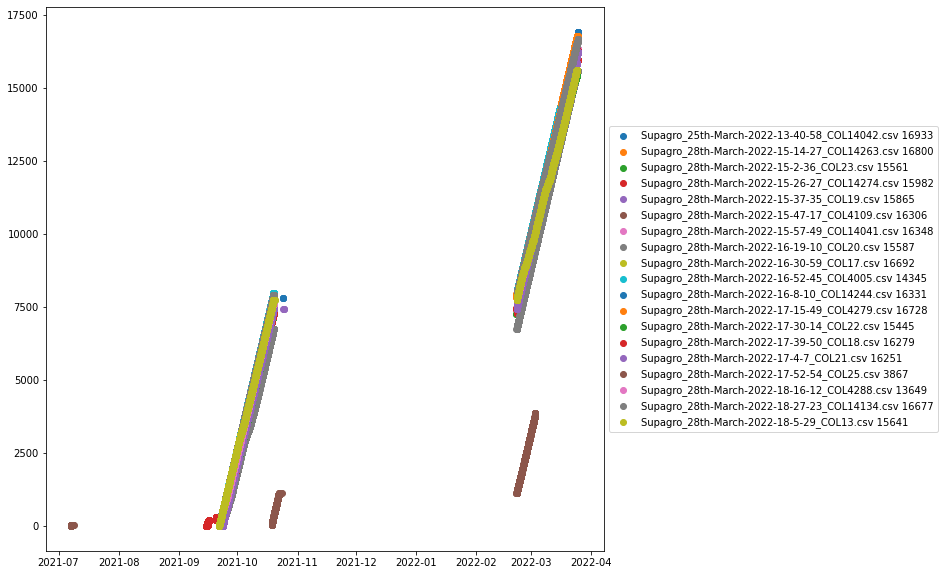

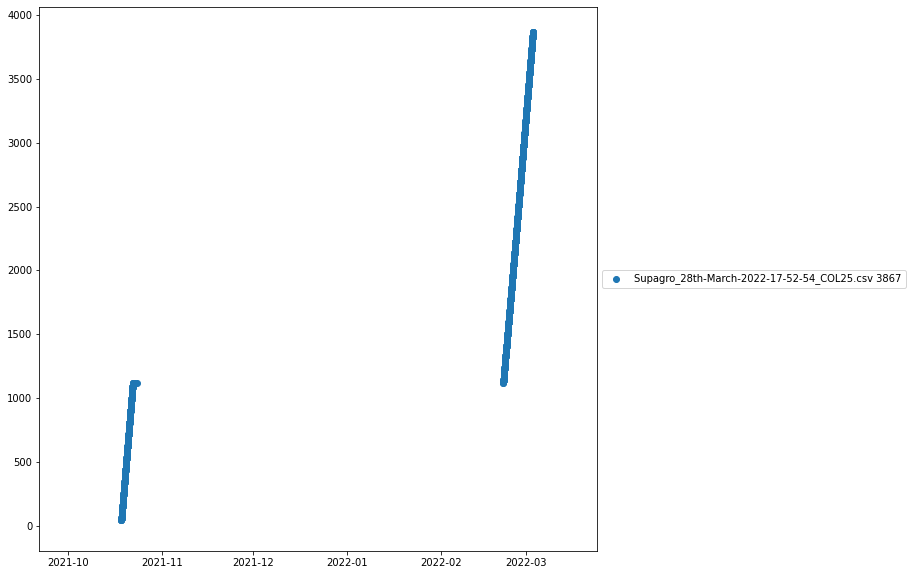

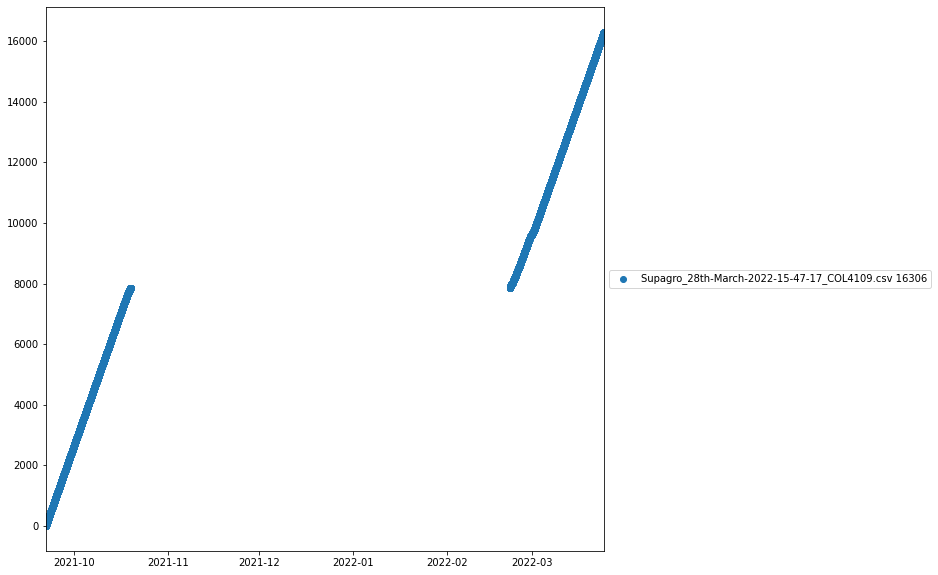

In [27]:


#fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
for k,df in cleanDatasetList.items():
    #plt.plot(df.date,marker='.',linestyle='none',label=k+" "+str(len(df.date)))
    plt.scatter(x=df.date,y=df.index,label=k+" "+str(len(df.date)))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #df.reset_index().plot(ax=ax,x='index',y='date',figsize=(20, 10), legend=True, kind='scatter')   

plt.figure(figsize=(10,10))
k='Supagro_28th-March-2022-17-52-54_COL25.csv'
df = cleanDatasetList[k]
plt.scatter(x=df.date,y=df.index,label=k+" "+str(len(df.date)))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlim([min_date,max_date])

plt.figure(figsize=(10,10))
k='Supagro_28th-March-2022-15-47-17_COL4109.csv'
df = cleanDatasetList[k]
plt.scatter(x=df.date,y=df.index,label=k+" "+str(len(df.date)))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlim([min_date,max_date])

Timestamp are correct now . However we observe a gap in the data. The gps sensors may have been disconnected for a long period. This could explain the discontinuity in the data. Let's get rid of the one with less data than other data.

In [28]:
# for filename in cleanDatasetList:
#     print(filename)
#     cleanDatasetList[filename] = cleanDatasetList[filename][:-4] + cleanDatasetList[filename][-3:]

Supagro_25th-March-2022-13-40-58_COL14042.csv


TypeError: cannot add DatetimeArray and DatetimeArray

In [16]:
# for df in cleanDatasetList:
#     df.timestamp.plot(figsize=(20, 10), legend=True)

AttributeError: 'str' object has no attribute 'timestamp'

# Distance and speed computing

A first aproach is to augment the data with the distance and the speed between each data point. The sheeps are not moving so far away so there is no need to project the data in lat/lon format to the cartesian plan for visualization. However, regarding the distance calculation, we will compute the geodesic distance.

In [31]:
%pip install geopy

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [32]:
import geopy.distance

STUDY_LATITUDE = 43
EARTH_CIRCUMFERENCE = 40075000

# add a distance column to the df. Geodesic distance calsulated from latitude and longitude 
def latLon_distanceFromSeries_df(df, lat='lat', lon='lat', system_circumference=EARTH_CIRCUMFERENCE):
    if not lat in df.columns or not lon in df.columns:
        print('error there is not latitude nor longitude columns')
        return df
    dfWithDist = df.copy()
    dist=[0]
    for i in range(1,len(df)):
        dist.append(geopy.distance.geodesic((df[lat].iloc[i],df[lon].iloc[i]),(df[lat].iloc[i-1],df[lon].iloc[i-1])).m)
    dfWithDist['dist']=dist
    return dfWithDist

# add speed columns to the df from distance
def speedFormDateDistSeries_df(df, time='timestamp', dist='dist'):
    if not time in df.columns or not dist in df.columns:
        print('error there is not time nor distance columns')
        return df
    dfWithSpeed = df.copy()
    speed=[0]
    for i in range(1,len(df)):
        speed.append(df[dist].iloc[i]/(df[time].iloc[i]-df[time].iloc[i-1]))
    dfWithSpeed['speed'] = speed
    return dfWithSpeed

In [40]:
# augmentation function for one dataset
def dataAugmentationPipeline(df):
    df = df\
        .pipe(latLon_distanceFromSeries_df)\
        .pipe(speedFormDateDistSeries_df)
    return df


In [35]:
# len(cleanDatasetList[15])

Apply the data augmentation on all datasets

In [41]:
augmentedDatasetList = [dataAugmentationPipeline(v) for k, v in cleanDatasetList.items() ]

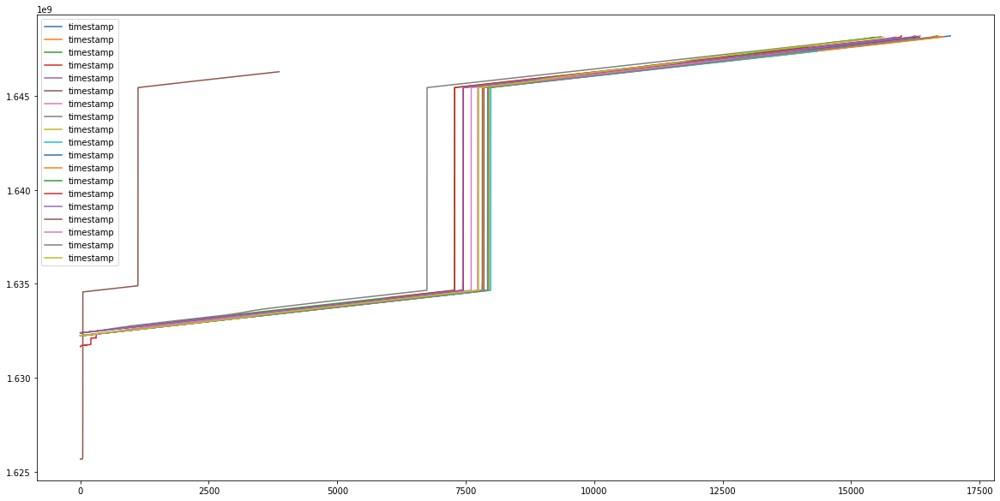

In [42]:
for df in augmentedDatasetList:
    df.timestamp.plot(figsize=(20, 10), legend=True)

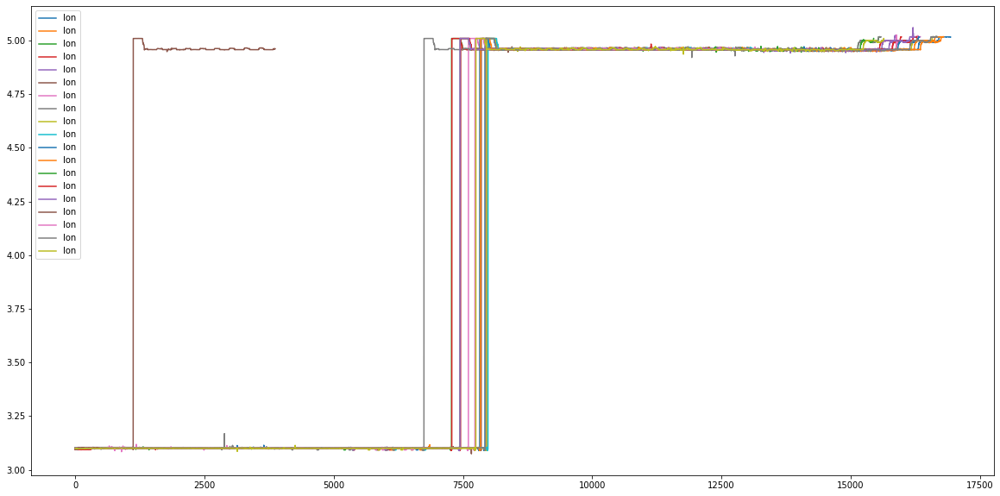

In [43]:
for df in augmentedDatasetList:
    df.lon.plot(figsize=(20, 10), legend=True)

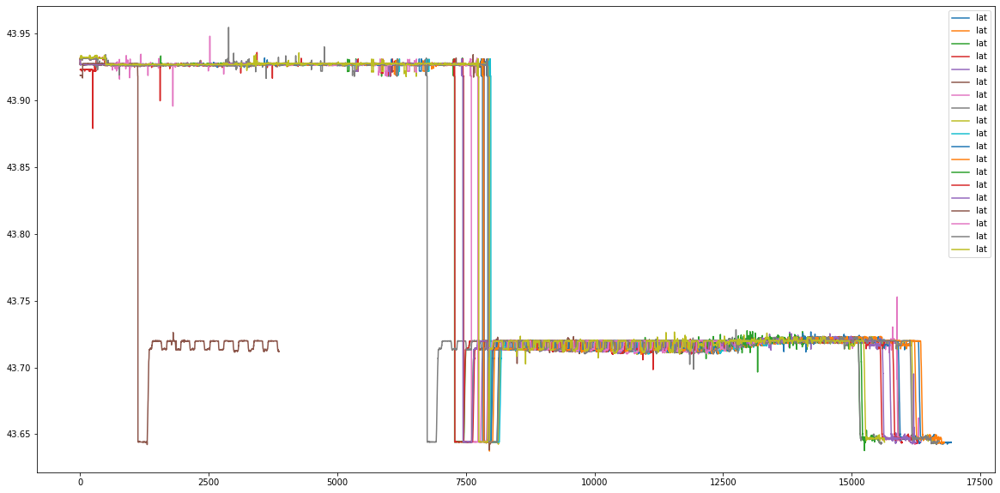

In [44]:

for df in augmentedDatasetList:
    df.lat.plot(figsize=(20, 10), legend=True)

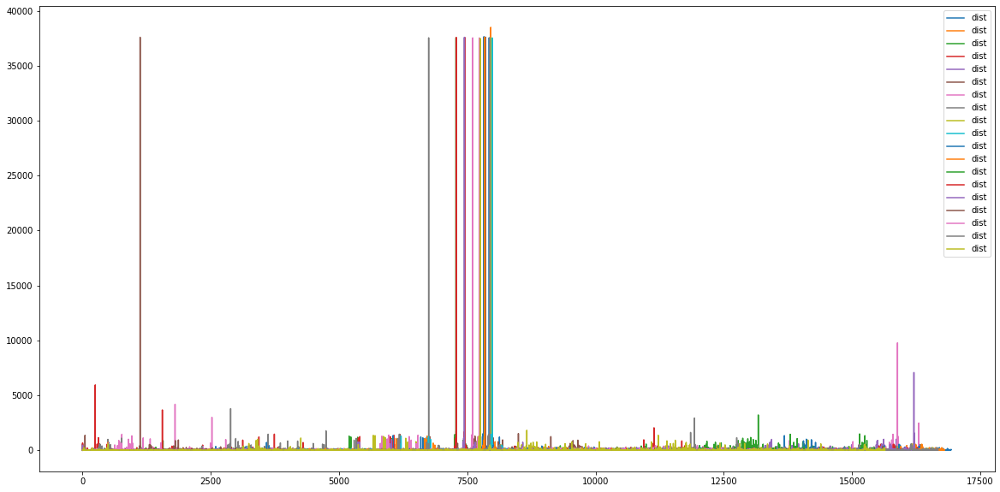

In [45]:

for df in augmentedDatasetList:
    df.dist.plot(figsize=(20, 10), legend=True)

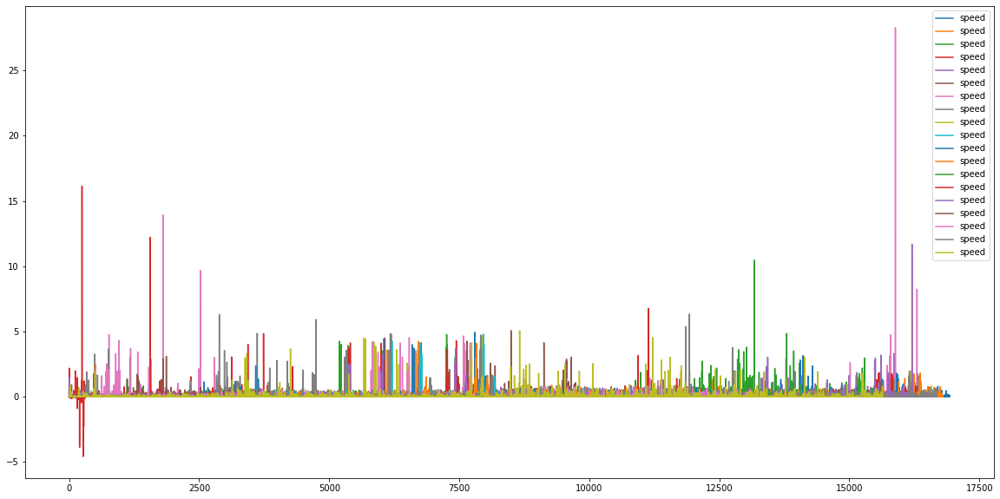

In [46]:

for df in augmentedDatasetList:
    df.speed.plot(figsize=(20, 10), legend=True)

We can see that the discontinuity observed sooner aboout the timestamp is also visible on the latitude and the longitude plots. We can suppose that when the gps were stopped, the sheep were moved. It is also possible that the sensors were stopped and moved to be used on other sheep samples.

# Plot area

In [47]:
import folium
# import streamlit_folium

def plotArea(samples):
    lonMin = min(samples.lon) - 0.001
    lonMax = max(samples.lon) + 0.001
    latMin = min(samples.lat) - 0.001
    latMax = max(samples.lat) + 0.001

    map_osm = folium.Map(location=[43.92, 3.10])

    #for ind, lat, lon, com in df[['lat', 'long', 'Nom commune']][:50].itertuples():
    #    map_osm.add_child(folium.RegularPolygonMarker(location=[lat,lon], popup=com,
    #                       fill_color='#132b5e', radius=5))
    for i, lat, lon, date in samples[['lat', 'lon', 'date']].itertuples():
        map_osm.add_child(
            folium.RegularPolygonMarker(
                location=[lat,lon],
                popup=(date, lat, lon),
                fill_color='#132b5e', radius=5
            )
        )

    map_osm.fit_bounds([[latMin,lonMin], [latMax,lonMax]])
    return map_osm


In [48]:
samples=df[df.lat > 43.9] # parse data to one area
plotArea(samples)

# Get one day subset

In [49]:
def getDaysSubsetFromIndex(dataset, startIndex, nbDays=1):
    endIndex=startIndex
    while dataset.timestamp[endIndex] < dataset.timestamp[startIndex] + nbDays*86400:
        if endIndex>= len(dataset):
            break
        endIndex+=1
    return dataset[startIndex:endIndex].reset_index(drop=True)
    
def getDaysSubset(dataset, startIsoDate, nbDays=1):
    startTimestamp = datetime.strptime(startIsoDate, "%d/%m/%Y").timestamp()
    startIndex=0
    while dataset.timestamp[startIndex] < startTimestamp:
        startIndex+=1
    return getDaysSubsetFromIndex(dataset, startIndex, nbDays=nbDays)



In [50]:
day = '19/10/2021'
daySample = getDaysSubset(df, day)
px.line(daySample.speed)

In [51]:
plotArea(daySample)

# Moving average

Clean does not meen relevant. We need to sanitize the data. The folling part will be focus on how to get rid of the extrems value.

Let's first code a function to convert a serie into its moving average version and try to see the the impact of of the smoothing parameter.

In [52]:
# return the moving average of the serie x. w is the number of previous item taken into account during the average.
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 1),
                    mode='lines',
                    name='1'))
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 2),
                    mode='lines',
                    name='2'))
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 3),
                    mode='lines',
                    name='3'))
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 4),
                    mode='lines',
                    name='4'))

fig.show()

Greater the smooth is more the serie is shifted backwards. We don't want to lose too much information so I think a smooth value of 2 is suffisent

Let's dev a function that convert an entire dataframe to its moving average equivalent. This will help to convert multiple series "at ones".

In [84]:
def moving_average_df(df, columnsForMa, smooth):
    maDf = df[df.columns][:-(smooth-1)].reset_index(drop=True)
    for column in columnsForMa:
        maDf[column] = moving_average(df[column], smooth)
    return maDf

Now let's see if there is any difference on the final speed serie regarding the position of the moving average calculation in the pipeline. Let's compare if we do the moving average of lat and long and then compute the speed and if we do the speed calculation and then the moving average.

In [81]:
maDaySample = moving_average_df(daySample, ['lat', 'lon'], 3)
maDaySample = latLon_distanceFromSeries_df(maDaySample)
maDaySample = speedFormDateDistSeries_df(maDaySample)

smooth = 3

fig = go.Figure()
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 1),
                    mode='lines',
                    name='original serie'))
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(maDaySample.speed, 1),
                    mode='lines',
                    name='smooth on lat/lon then speed calculation'))
fig.add_trace(go.Scatter(x=daySample.timestamp, y=moving_average(daySample.speed, 2),
                    mode='lines',
                    name='speed calculation then smooth'))

fig.show()

In [56]:
print(daySample.head())
print(maDaySample.head())

    timestamp        lat       lon                date       dist     speed
0  1634594538  43.927530  3.100700 2021-10-18 22:02:18  29.474870  0.098250
1  1634594838  43.927555  3.100672 2021-10-18 22:07:18   3.427308  0.011424
2  1634595138  43.927814  3.100435 2021-10-18 22:12:18  35.506885  0.118356
3  1634595438  43.927803  3.100440 2021-10-18 22:17:18   1.508013  0.005027
4  1634595738  43.927746  3.100505 2021-10-18 22:22:18   7.814252  0.026048
    timestamp        lat       lon                date       dist     speed
0  1634594538  43.927633  3.100602 2021-10-18 22:02:18   0.000000  0.000000
1  1634594838  43.927724  3.100516 2021-10-18 22:07:18  12.475392  0.041585
2  1634595138  43.927788  3.100460 2021-10-18 22:12:18   8.728201  0.029094
3  1634595438  43.927714  3.100523 2021-10-18 22:17:18  10.099123  0.033664
4  1634595738  43.927629  3.100612 2021-10-18 22:22:18  11.698537  0.038995


There is indeed a difference between the two. In my opinion doing the smooth after the speed calculation have less shift and better handle oscillation in the serie.

In [57]:
daySample = moving_average_df(daySample, ['speed'], 2)

# Speed threshold classification

## Load custom thresholds

In [58]:
THRESHOLDS = [0.01, 0.2, 3.0, 130.0]
CATEGORIES = ['resting', 'grazing', 'moving', 'transpoting', 'plane', 'rocket']

## Classify data with custom thresholds

In [59]:
def categorizeSpeed_df(df, thresholds, categories, speed='speed'):
    if not speed in df.columns:
        print('error there is not speed columns')
        return df

    def speedMap(speed):
        thresholdsDict = {category: thresholds[i] for i, category in enumerate(categories)}
        for action, speedThreshold in thresholdsDict.items():
            if speed < speedThreshold:
                return action
        return 'tooFast'
        
    dfWithAction = df.copy()
    dfWithAction['action'] = dfWithAction.speed.map(lambda s: speedMap(s))
    return dfWithAction.reset_index(drop=True)

thresholds = [0.01, 0.2, 3.0, 130.0]
daySample = categorizeSpeed_df(daySample, thresholds, CATEGORIES[:len(thresholds)])
daySample.head()

,timestamp,lat,lon,date,dist,speed,action
0,1634594538,43.927530,3.100700,2021-10-18 22:02:18,29.474870,0.054837,grazing
1,1634594838,43.927555,3.100672,2021-10-18 22:07:18,3.427308,0.064890,grazing
2,1634595138,43.927814,3.100435,2021-10-18 22:12:18,35.506885,0.061691,grazing
3,1634595438,43.927803,3.100440,2021-10-18 22:17:18,1.508013,0.015537,grazing
4,1634595738,43.927746,3.100505,2021-10-18 22:22:18,7.814252,0.047982,grazing


# Speed classification K-means

## K-means algo

In [60]:
# return the mean of each concecutive pair of centroid (ex. [1, 2, 3] return [1.5, 2.5]).
def thresholdsFromClusterCenters(centroids):
  centroids = sorted(list(centroids.flat))
  return [(centroids[i]+centroids[i+1])/2 for i in range(len(centroids)-1)]

# return the mean duration of consecutive action for each action in minutes.
def meanClassificationSequenceDuration(df, classColumn='action'):
    if not classColumn in df.columns:
        print('error there is no classification columns named:', classColumn)
        return {}
    sequenceDurations = {classification: [] for classification in df[classColumn].unique()}
    prevClass = df[classColumn][0]
    classStart = df['timestamp'][0]
    for i, action in enumerate(df[classColumn][1:]):
        idx = i+1
        if action != prevClass:
            sequenceDurations[prevClass].append(df['timestamp'][idx]-classStart)
            prevClass=action
            classStart=df['timestamp'][idx]

    durations = {action:sum(actionSequencesDurations)/len(actionSequencesDurations) if len(actionSequencesDurations)!=0 else 0 for action, actionSequencesDurations in sequenceDurations.items() }
    return {classification:divmod(sec, 60) for classification, sec in durations.items()}
        

Let's try to run a first KMeans algo

First we need to define every data sample we will fit the kmeans algo on. We the goal is first to create data samples without the big discontinuity in them. For simplicity we will slice each dataset with the same value. 

![slice](images/sliceData.png)

In [61]:
def sliceSamples(dataSamplesList):
    samples = []
    for sample in dataSamplesList:
        samples.append(sample[500:6250])
        samples.append(sample[8500:15000])
    return samples

slicedDatasetList = sliceSamples(augmentedDatasetList)

Do not forgot to take the moving average for each sample! :)

In [89]:
finalDataSetList = [moving_average_df(dataset, ['speed'], 2) for dataset in slicedDatasetList if len(dataset)>0]

In [90]:
from sklearn.cluster import KMeans

# return a trained kmeans regarding a particular timeframe (step)
def trainedKMeans(datasetList, nCluters, step):
    kmeans = KMeans(n_clusters=nCluters)

    for dataset in datasetList:
        kmeans.fit(np.array(dataset[::int(step/5)].speed).reshape(-1, 1))
    return kmeans

kmeans = trainedKMeans(finalDataSetList, 4, 5)

centroids = kmeans.cluster_centers_ 
thresholdsFromClusterCenters(centroids)

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppDat

[0.15535575875030005, 0.6542822718079572, 1.6438825288918004]

Let's find the optimum number of clusters.
Elbow method:

In [91]:
kmeans_per_k = [trainedKMeans(finalDataSetList, k, 5) for k in range(2, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

px.line(inertias)

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppDat

In [92]:
kmeans_per_k = [trainedKMeans(finalDataSetList, k, 10) for k in range(2, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

px.line(inertias)

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppDat

It seems that there is a small elbow at k=4. The elbow is not very clear.

Let's train KMeans for different timeframe : 5, 10, 20 and 25 minutes

In [93]:
kmeans_per_timeframe = [trainedKMeans(finalDataSetList, 4, timeframe) for timeframe in [5, 10, 15, 20, 25]]


C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\agademer\AppDat

Let's see the centers value:

In [94]:
[sorted(k.cluster_centers_) for k in kmeans_per_timeframe]

[[array([0.03465841]),
  array([0.27464034]),
  array([1.03263463]),
  array([2.25513043])],
 [array([0.03107807]),
  array([0.22616258]),
  array([0.82230494]),
  array([2.14180036])],
 [array([0.03617384]),
  array([0.32367642]),
  array([1.42630482]),
  array([3.34374657])],
 [array([0.03232684]),
  array([0.24984851]),
  array([0.81902567]),
  array([2.22257678])],
 [array([0.03302429]),
  array([0.25207768]),
  array([0.88343926]),
  array([2.20322283])]]

The centers values seems be the same for kmeans train on different timeframe steps. However the last cluster center value is the one that change the most. Changing the timeframe seems to have more influence on the boundary between the 3rd and the la cluster.

# Dashboard

A dashboard can be pretty usefull to go through the data and see classification evolution regarding the timeframe. (On vscode, you may re-run this cell if one slider or the plot is missing. If the plot is empty but yu have the 3 sliders, just update one of them).

In [95]:
%pip install dash jupyter_dash

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [96]:
from dash import dcc, html, Input, Output
from jupyter_dash import JupyterDash
import plotly.graph_objects as go
import numpy as np

def classBarPlot(data, classSerie):
    return px.bar(data, color=classSerie)

def dashboard(datasetList):
    app = JupyterDash(__name__)

    app.layout = html.Div([
        html.P('Interactive speed value and classification over time.'),
        dcc.Graph(id="graph"),
        html.P("Time frame:"),
        dcc.Slider(id="sliderTimeframe", min=5, max=25, value=5, step=5),
        html.P("Day:"),
        dcc.Slider(id="sliderDay", min=1, max=100, value=1, step=1),
        html.P("Sample:"),
        dcc.Slider(id="sliderDataset", min=1, max=len(datasetList), value=1, step=1),
    ])

    @app.callback(
        Output("graph", "figure"), 
        Input("sliderTimeframe", "value"),
        Input("sliderDay", "value"),
        Input("sliderDataset", "value")
    )
    def update_bar_chart(timeframe, days, datasetIndex):
        thresholds = thresholdsFromClusterCenters(kmeans_per_timeframe[int(timeframe/5)-1].cluster_centers_)
        data = getDaysSubsetFromIndex(datasetList[datasetIndex-1], 10*days)
        newData = data[::int(timeframe/5)]
        newData = newData\
            .pipe(latLon_distanceFromSeries_df)\
            .pipe(speedFormDateDistSeries_df)\
            .pipe(categorizeSpeed_df, thresholds, CATEGORIES[:len(thresholds)])
            
        return classBarPlot(newData.speed, newData.action)
    
    app.run_server(mode='inline', debug=True)

dashboard(finalDataSetList)

C:\Users\agademer\AppData\Roaming\Python\Python310\site-packages\dash\dash.py:538: UserWarning:

JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.



One other good visualisation would be to plot the sheep tracks with the classification for each point. That's what the next cell do.

In [103]:
def addFixedOverlay(map, txtInHTML,cornerRef="BL",position=(50,50),z_index=9999,div_style=""):
    switch = {"BL":'bottom: {}px; left:{}px;',
               "TL":'top: {}px; left:{}px;',
               "TR":'top: {}px; right:{}px;',
               "BR":'bottom: {}px; right:{}px;',
               "TC":'top: {}px; left:50%;margin-left:{}px;', # second param should be the half of the width
               "BC":'bottom: {}px; left:50%;margin-left:{}px;', # second param should be the half of the width
             }
    
    print(switch[cornerRef].format(position[0],position[1]))
    overlay_html="""
<div style="position: fixed; {} z-index: {}; background-color: white; padding: 10px; border: 2px solid grey; {} ">
{}
</div>
""".format(switch[cornerRef].format(position[0],position[1]),z_index,div_style,txtInHTML)
    map.get_root().html.add_child(folium.Element(overlay_html))

In [109]:
def map(daySamples):
    map_osm = folium.Map(location=[43.92, 3.10], max_zoom = 23)

    #for ind, lat, lon, com in df[['lat', 'long', 'Nom commune']][:50].itertuples():
    #    map_osm.add_child(folium.RegularPolygonMarker(location=[lat,lon], popup=com,
    #                       fill_color='#132b5e', radius=5))
    lonMin = min(daySamples.lon) - 0.001
    lonMax = max(daySamples.lon) + 0.001
    latMin = min(daySamples.lat) - 0.001
    latMax = max(daySamples.lat) + 0.001
    points = []
    for i, lat, lon, date, action, speed in daySamples[['lat', 'lon', 'timestamp', 'action', 'speed']].itertuples():
        if action == 'resting':
            map_osm.add_child(
                folium.RegularPolygonMarker(
                    location=[lat,lon],
                    popup=(date, speed, action),
                    fill_color='#132b5e', radius=5
                )
            )
        elif action == 'grazing':
            map_osm.add_child(
                folium.CircleMarker(
                    [lat, lon],
                    radius=5, 
                    popup=(date, speed, action), 
                    color="#e74c3c",
                    fill_color="#e74c3c",
                    fill_opacity=0.9
                )
            )
        elif action == 'moving':
            map_osm.add_child(
                folium.CircleMarker(
                    [lat, lon],
                    radius=5, 
                    popup=(date, speed, action), 
                    color="#e303fc",    
                    fill_color="#e303fc", 
                    fill_opacity=0.9
                )
            )
        else:
            map_osm.add_child(
                folium.CircleMarker(
                    [lat, lon],
                    radius=5, 
                    popup=(date, speed, action), 
                    color="#27ae60",
                    fill_color="#27ae60",
                    fill_opacity=0.9
                )
            )
        points.append(tuple([lat, lon]))
    folium.PolyLine(points, color="white", weight=1, opacity=1).add_to(map_osm)
    map_osm.fit_bounds([[latMin,lonMin], [latMax,lonMax]])
    return map_osm

map_osm = map(daySample[::int(5/5)]) # for 5 min timeframe

addFixedOverlay(map_osm,"<p><span style='color: #132b5e;'>▬</span> Resting<br/><span style='color: #e74c3c;'>●</span> Grazing<br/><span style='color: #e303fc;'>●</span> Moving<br/></p><p>Author: E. Lacourt / A. Gademer.</p><p> Date: 17/01/2023.</p><p>Sources : P@stor'all data, OSM background</p>",cornerRef="BR",position=(15,10),div_style="max-width:300px;")
#map_osm.add_child(folium.LayerControl(collapsed=False)) # You need to call it AFTER adding all your layers.


# map(daySample[::int(10/5)]) # for 10 min timeframe
# map(daySample[::int(15/5)]) # for 15 min timeframe
display(map_osm)

bottom: 15px; right:10px;


In [99]:
map_osm.save("out.html")